In [2]:
#import dicom
import pydicom as dc
import os
import numpy as np
import matplotlib as plt
import natsort as ns
import cv2
#print(cv2.__version__)
#%pylab inline
#import imutils
#import scipy
from scipy import ndimage
from matplotlib import pyplot
import imutils

In [3]:
# Use os to get list of filepaths:

dataDir = r'C:\\DICOM'

fpaths = []  # create an empty list of all DICOM file paths

for dirName, subdirList, fileList in os.walk(dataDir):
    for filename in fileList:
        if ".dcm" in filename.lower():  # check for DICOM files only
            fpaths.append(os.path.join(dirName,filename))
            
#len(fpaths) # =22 (OK)

# Since ordering is 3-1, 3-10, 3-11, ... 
# use natsort to sort in natural way:
fpaths = ns.natsorted(fpaths)

In [16]:
# Try reading in a file:
frame = dc.read_file(fpaths[11])
#frame = dc.read_file(fpaths[11], dtype=np.int8)


#someData
frame.pixel_array

array([[15,  9, 10, ..., 25, 19, 21],
       [ 2, 10, 16, ..., 18, 26, 20],
       [ 7, 16, 13, ..., 15, 30, 23],
       ...,
       [ 5,  6,  6, ..., 47, 45, 38],
       [17, 10,  6, ..., 46, 45, 38],
       [17,  4,  9, ..., 55, 37, 42]], dtype=uint16)

# Plot data:
pyplot.figure(dpi=300)
pyplot.axes().set_aspect('equal', 'datalim')
pyplot.set_cmap(pyplot.gray())
#pyplot.pcolormesh(someData.pixel_array);
pyplot.pcolormesh(np.fliplr(np.flipud(frame.pixel_array)));

In [20]:
# Now load in all images and store in 3D numpy array:

# Need to create an empty array so need dims:

# The 3D array will have dims Columns x Rows x Slices (X x Y x Z):
"""
frame.Columns  =384
frame.Rows  =384
"""
dimX = frame.Columns
dimY = frame.Rows
dimZ = len(fpaths)

print('Pixel dims = ', dimX , 'x', dimY, 'x', dimZ, '\n')

# To display the images in the correct physiological scalings, 
# need to know the pixel spacing (dpix) along x, y and z:
"""
frame.PixelSpacing  = ['0.625', '0.625'] <-- strings
frame.SliceThickness  = '4' <-- string
"""
dpixY = float(frame.PixelSpacing[0])
dpixX = float(frame.PixelSpacing[1])
dpixZ = float(frame.SliceThickness)

print('Pixel spacing = ', dpixX , 'x', dpixY, 'x', dpixZ, '\n')

# Create empty 3D array using same datatype as pixel_array:
framesOrig = np.zeros((dimY, dimX, dimZ), dtype=frame.pixel_array.dtype)

#data.shape # = (384, 384, 22)

# Create x, y and z axes for plotting:
x = np.arange(0.0, dimX*dpixX, dpixX)
y = np.arange(0.0, dimY*dpixY, dpixY)
z = np.arange(0.0, dimZ*dpixZ, dpixZ)

print('Axes lengths = ', x.shape , 'x', y.shape, 'x', z.shape, '\n')

# Load image data into data array by looping through each slice:
for f in range(dimZ):
    frame = dc.read_file(fpaths[f])
    #frame = np.fliplr(np.flipud(frame)) # fliplf and flipup
    
    framesOrig[:, :, f] = frame.pixel_array # store in array
    
framesOrig = np.fliplr(np.flipud(framesOrig)) # fliplf and flipup

print('framesOrig.shape = ', framesOrig.shape, '\n')

AttributeError: 'numpy.ndarray' object has no attribute 'Columns'

In [25]:
Nrows, Ncols = frame.shape

Nrows

384

# Display all frames:

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'6', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(dpi=300)

for f in range(dimZ):
    frame = data[:,:,f]

    ax = pyplot.subplot(5,5,1+f, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title(str(1+f), **title_font)
    
    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

In [21]:
# Normalise the pixel values to 255 to convert to uint8:

# Create empty 3D array using same datatype as pixel_array:
frames = np.zeros((dimY, dimX, dimZ), dtype='uint8')

framesOrigMaxVal = np.max(framesOrig[:,:,:])

""" No need to do this in a loop! 
for f in range(dimZ):
    frameOrig = framesOrig[:,:,f]

    #frame = frameOrig/framesOrigMaxVal
    frame = np.uint8(255.0*frameOrig/framesOrigMaxVal)

    frames[:,:,f] = frame
"""
        
frames = np.uint8(255.0*framesOrig/framesOrigMaxVal)

# Plot result of unit8 conversion:

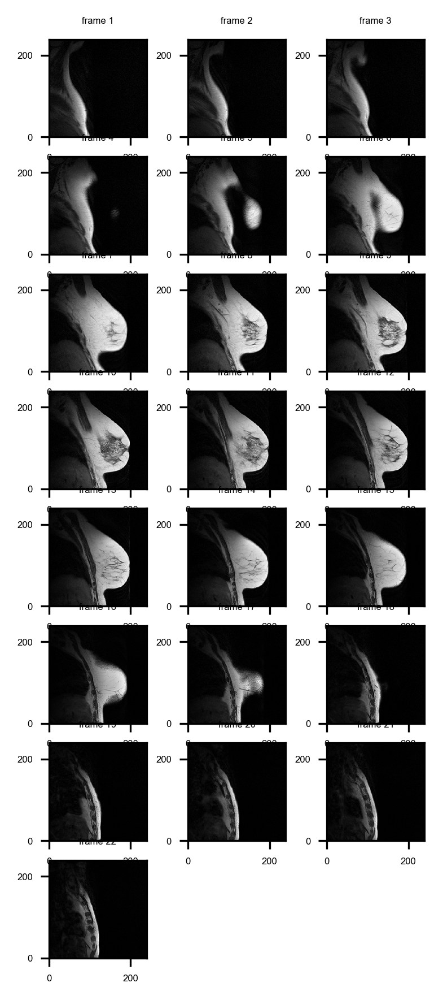

In [22]:
# Plot result of unit8 conversion:


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

for f in range(dimZ):
    frame = frames[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,3,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.set_cmap(pyplot.gray())
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

# Instead of using cv.threshold, use for loops and different thresholds:

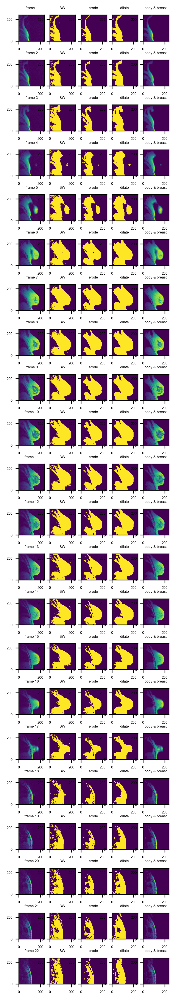

In [7]:
# This time try to close the large holes by looking at the black pixels 
# and turning them to white if the position of the black pixel is left 
# of the centre-of-mass of the the mask averaged for all rows:
#
# Decide whether to perform left-fill operation described above:
left_fill = 0
#left_fill = 1

# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:

ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

thresh_body = 0.15 # = 15%
thresh_breast = 0.40 # = 40%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel15 = np.ones((15,15),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
#bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
#backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

if left_fill:
    cols = 7
else:
    cols = 5

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background
    #thresh = InvAvePixVal*thresh_background
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')
    
    #mask = cv2.threshold(frame, thresh, 255, cv2.THRESH_BINARY)[1]
    #mask = cv2.threshold(frameInv, thresh, 255, cv2.THRESH_BINARY)[1]

    # Take inverse of mask:
    #mask = 255 - mask
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    # Erode before left-filling:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        
        
    # Left-fill holes by turning black pixels white if they are
    # left of the right-most white pixel at that same row (y):
    if left_fill:
        for r in range(dimY):
            # Find the indexes of the white pixels for this row:
            inds = np.where(mask[r,:]==255)[0] # this will return [] if no white pixels!

            if inds.size > 0: # if inds not []
                # Find the centre-of-mass:
                com = int(np.average([inds[0], inds[-1]]))

                for c in range(dimX):
                    if c < com: # the pixel is left of com
                        #mask[r,c] = 255
                        mask[r,c] = 1



        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('left-filled ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)



        # Close holes left behind after left-filling for cases 
        # where ind=[]:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
    
    
    
    if 0:
        # Erode:
        #out = cv2.erode(out, Kernel3, iterations = 5) 
        #mask = cv2.erode(mask, Kernel3, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 7)
        #mask = cv2.erode(mask, Kernel2, iterations = 10)
        #mask = cv2.erode(mask, Kernel2, iterations = 15)
        #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
        #mask = cv2.erode(mask, Kernel2, iterations = 30)
        #mask = cv2.erode(mask, Kernel3, iterations = 5)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        mask = cv2.erode(mask, Kernel3, iterations = 3)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


        
        
        

    # Convert mask to binary:
    #bodyAndBreastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]
    bodyAndBreastMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)




In [ ]:
"""
The results are quite ok but for some reason it's flattening out the breast in some frames.
It's as if the algorithm is top-filling (filling upwards) rather than left-filling (filling
downwards). I can't see why it would be doing this.
"""

In [ ]:
""" 
Next try creating bodyMasks for each frame using an appropriate threshold to be below 
starting with the images masked by bodyAndBreastMasks
"""

In [ ]:
""" 
The issue with trying to isolate the breast from body is that for frames where there is only
a small portion of breast the pix values are lower or similar to pixel values of the body.
So regardless of whether I threshold pixels above or below a value it will be tricky.

Another idea that came to mind is to blur the frames significantly such that the small
portion of breast in some frames is (hopefully) blurred away.  Then isolating the body
might be easier, to obtain bodyMasks. Then with breastAndBodyMasks and bodyMasks I can 
obtain breastMasks.
"""

# First verify that bodyAndBreastMasks are sensible:

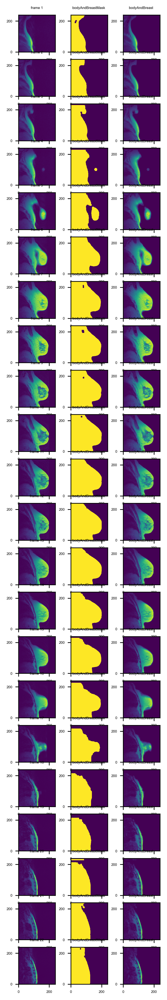

In [47]:
# First verify that bodyAndBreastMasks are sensible:

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 3

for f in range(dimZ):
    frame = frames[:,:,f]
    
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('bodyAndBreastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        
    bodyAndBreast = bodyAndBreastMask*frame
        
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('bodyAndBreast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
#blurKernel = 7 # too high (artifact in frame 4 above breast)

# Create empty 3D array for framesBlurred:
framesBlurred = np.zeros((dimY, dimX, dimZ), dtype='uint8')

for f in range(dimZ):
    frame = frames[:,:,f]
    
    frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)

    framesBlurred[:,:,f] = frameBlurred

# Isolating the breast was difficult. This time try to isolate the body using bodyAndBreastMasks to help. Blurring the image first might help:

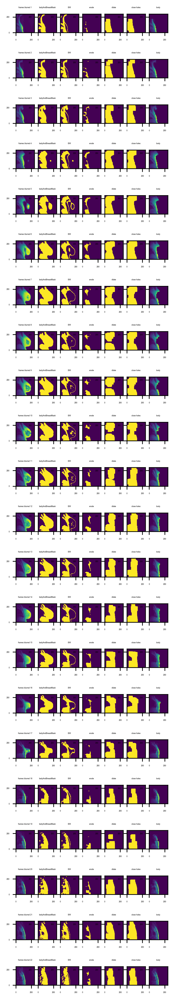

In [8]:
 """ 
 This is very difficult without either leaving out significant breast and/or
 leaving in significant body (ribs).
 
 I think I need to start by using bodyAndBreastsMasks to remove the background.
 Then select an appropriate threshold and use it to find all pixels < thresh
 that relate to the body and not the breast.
 It might be useful to threshold at a value that is a % of the ave pix value
 in the result of removing the background.
 
 Isolating the breast was difficult. This time blur the image first 
 (might help reduce holes due to dark blood vessels).
 """

""" It does seem to perform a bit better - see frame 4 - the breast is preserved """
  
# Chose whether or not to erode bodyAndBreastMasks before using them:
erode_bodyAndBreastMasks = 0
#erode_bodyAndBreastMasks = 1

# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:
ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

#avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0
#avePixVal = np.average(framesBlurred[:,:,:]) # this will be updated if ave_all_frames = 0
avePixVal = np.average(frames[:,:,:])

# Try different thresholds for body, breast and background
# using max pix value (maxPixVal) in each frame or
# using max pix value across all frames:
max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 
""" 
Since the pixel values of the body doesn't seem to change much from 
frame to frame, it might be sufficient to use a fixed threshold. 
It seems reasonable for the fixed threshold to be a % of the maxPixVal,
rather than the avePixVal.
"""

# Chose whether to use frames or framesBlurred:
use_blurred = 0 # use frames
use_blurred = 1 # use framesBlurred

# Get the max pixel value:
if use_blurred:
    #maxPixVal = np.max(framesBlurred[:,:,:])
    frames_used = 'frames blurred ' # used for plot titles
else:
    #maxPixVal = np.max(frames[:,:,:]) 
    frames_used = 'frames ' # used for plot titles

    
    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%



# A threshold value of 40% of avePixVal was useful for isolating the body+breast from
# the background.  Now try to determine a suitable threshold value as a % of maxPixVal
# that isolates the breast from the body:
thresh_breast = 0.8 # = 80% of maxPixVal (too high)
thresh_breast = 0.7 # = 70% of maxPixVal (too high)
#thresh_breast = 0.5 # = 50% of maxPixVal (too high)
#thresh_breast = 0.25 # = 20% of maxPixVal (ok-ish when using maxPixVal for all frames)
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)
#thresh_breast = 0.5 # not better than 0.6 for blurred images
#thresh_breast = 0.55 # not better than 0.6 for blurred images

# Select appropriate threshold for body as a % of maxPixVal:
thresh_body = 0.15 # = 15% of maxPixVal 
#thresh_body = 0.05 # = 5% of maxPixVal
#thresh_body = 0.1 # = 10% of maxPixVal
thresh_body = 0.3 # 30% of maxPixVal
thresh_body = 0.2 # 20% of maxPixVal <--- seems to be good
thresh_body = 0.25 # 25% of maxPixVal <-- 20% was better (but maybe 25% will be better after erosion?)
thresh_body = 0.5 # 50% of maxPixVal <-- better than ~20-25% with single maxPixVal
#thresh_body = 0.6 # 60% of maxPixVal <-- too high
#thresh_body = 0.55 # 55% of maxPixVal <-- too high
""" 
For some bizarre reason higher values for thresh_body (which result in higher values
of thresh) give a better result, i.e. more body is preserved!!

thresh_body = 0.25 is decent for max_all_frames = 1

"""

# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
blurKernel = 7 # too high (artifact in frame 4 above breast)
blurKernel = 15 # too high (artifact in frame 4 above breast)

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes
Kernel70 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyMasks for each frame:
#bodyMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
bodyMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'2', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

if erode_bodyAndBreastMasks:
    cols = 8
else:
    cols = 7

for f in range(dimZ):
    if use_blurred:
        #frame = framesBlurred[:,:,f]
        frame = cv2.GaussianBlur(frames[:,:,f], (blurKernel, blurKernel), 0)
        frame = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0) # blur again
    else:
        frame = frames[:,:,f]
    
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    if not max_all_frames:
        maxPixVal = np.max(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame); # note frame could be blurred!
    pyplot.title(frames_used + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
    
    
    # Use bodyAndBreastMasks:
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask); # note frame could be blurred!
    pyplot.title('bodyAndBreastMask', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    if erode_bodyAndBreastMasks:
        # To help with isolating the body from breast, erode 
        # bodyAndBreastMask a little. But first need to convert to uint8:
        #bodyAndBreastMask = np.uint8(bodyAndBreastMask)

        #bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 5) 
        bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 15)
        #bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 20)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, bodyAndBreastMask);
        pyplot.title('bodyAndBreastMask eroded', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
    
    
    
    """ First isolate the body using thresh_body: """
    
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    #thresh = maxPixVal*thresh_breast
    thresh = maxPixVal*thresh_body
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')

    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] < thresh:
                #mask[r,c] = 255
                mask[r,c] = 1
    
    
    # Use bodyAndBreastMasks to remove the background:
    #mask = mask*bodyAndBreastMasks[:,:,f]
    mask = mask*bodyAndBreastMask
    
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

    if 0:
        # Close small holes in BW:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel3) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel5)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
    
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 10)
    #mask = cv2.erode(mask, Kernel3, iterations = 20)
    #mask = cv2.erode(mask, Kernel3, iterations = 15) # good compromise for un-blurred frames (max_all_frames = 0, thresh_breast = 0.6)
    #mask = cv2.erode(mask, Kernel3, iterations = 17)# seems fine using blurred frames (max_all_frames = 0, thresh_breast = 0.6)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel3, iterations = 10) # decent for thresh_body = 0.25, max_all_frames = 1 and erode_bodyAndBreastMasks = 1
    #mask = cv2.erode(mask, Kernel3, iterations = 15) # higher than necessary if erode_bodyAndBreastMasks = 1
    #mask = cv2.erode(mask, Kernel3, iterations = 12) 
    #mask = cv2.erode(mask, Kernel3, iterations = 14)
    mask = cv2.erode(mask, Kernel3, iterations = 15)
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 15)
    #mask = cv2.dilate(mask, Kernel3, iterations = 20) # ok for thresh_body = 0.2
    #mask = cv2.dilate(mask, Kernel3, iterations = 25) # ok for thresh_body =
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 20)
    #mask = cv2.dilate(mask, Kernel3, iterations = 30)
    mask = cv2.dilate(mask, Kernel3, iterations = 40)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
        
        
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel70)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
        

    
    
            
            
    if 0:
        # Close holes:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
        


    # Convert mask to binary:
    #bodyMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]
    bodyMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    #backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    #breastMasks[:,:,f] = breastMask
    #backgroundMasks[:,:,f] = backgroundMask
    bodyMasks[:,:,f] = bodyMask

    # Show result of bodyMask:
    #breast = breastMask*frame
    body = bodyMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, body);
    pyplot.title('body ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

        
        
    # Now with bodyMasks and bodyAndBreastMasks

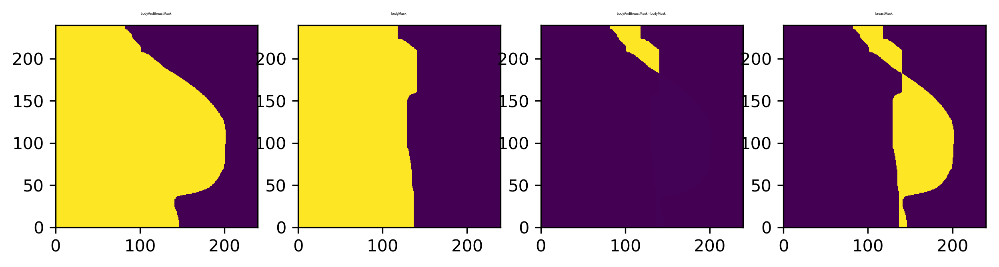

In [53]:
f = 11

frame = frames[:,:,f]
    
bodyMask = bodyMasks[:,:,f]
    
bodyAndBreastMask = bodyAndBreastMasks[:,:,f]

breastMask = np.logical_xor(bodyAndBreastMask, bodyMask)
    
pyplot.figure(figsize=(10, 10), dpi=300);

ax = pyplot.subplot(1,4,1, aspect='equal');
pyplot.pcolormesh(x, y, bodyAndBreastMask);
pyplot.title('bodyAndBreastMask ', **title_font);

ax = pyplot.subplot(1,4,2, aspect='equal');
pyplot.pcolormesh(x, y, bodyMask);
pyplot.title('bodyMask ', **title_font);

ax = pyplot.subplot(1,4,3, aspect='equal');
pyplot.pcolormesh(x, y, bodyAndBreastMask - bodyMask);
pyplot.title('bodyAndBreastMask - bodyMask ', **title_font);

ax = pyplot.subplot(1,4,4, aspect='equal');
pyplot.pcolormesh(x, y, breastMask);
pyplot.title('breastMask ', **title_font);

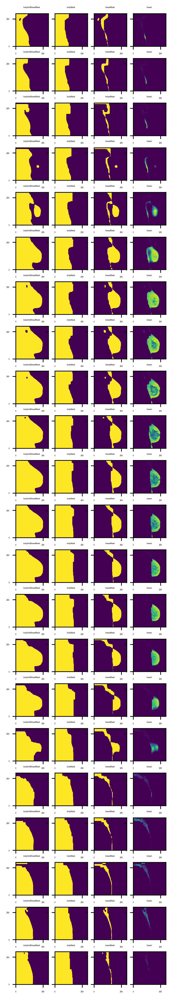

In [54]:
# Results with left filling:

cols = 4

i = 0

pyplot.figure(figsize=(3, 20), dpi=300)

for f in range(dimZ):
    frame = frames[:,:,f]
    
    bodyMask = bodyMasks[:,:,f]
    
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    breastMask = np.bitwise_xor(bodyAndBreastMask, bodyMask)
    #breastMask = bodyAndBreastMask*np.logical_not(bodyMask)
    
    breast = breastMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('bodyAndBreastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)


    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyMask);
    pyplot.title('bodyMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breastMask);
    pyplot.title('breastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breast);
    pyplot.title('breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        


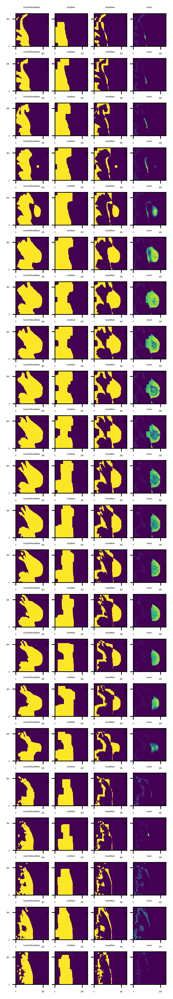

In [9]:
# Results without left filling:

cols = 4

i = 0

pyplot.figure(figsize=(3, 20), dpi=300)

for f in range(dimZ):
    frame = frames[:,:,f]
    
    bodyMask = bodyMasks[:,:,f]
    
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    breastMask = np.bitwise_xor(bodyAndBreastMask, bodyMask)
    #breastMask = bodyAndBreastMask*np.logical_not(bodyMask)
    
    breast = breastMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('bodyAndBreastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)


    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyMask);
    pyplot.title('bodyMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breastMask);
    pyplot.title('breastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breast);
    pyplot.title('breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        


# Combine the code in the two main algorithms above:

In [ ]:
"""
Since rough boundaries tend to be fairly smooth, smoothening contour lines could be a useful
way of creating boundaries.
"""

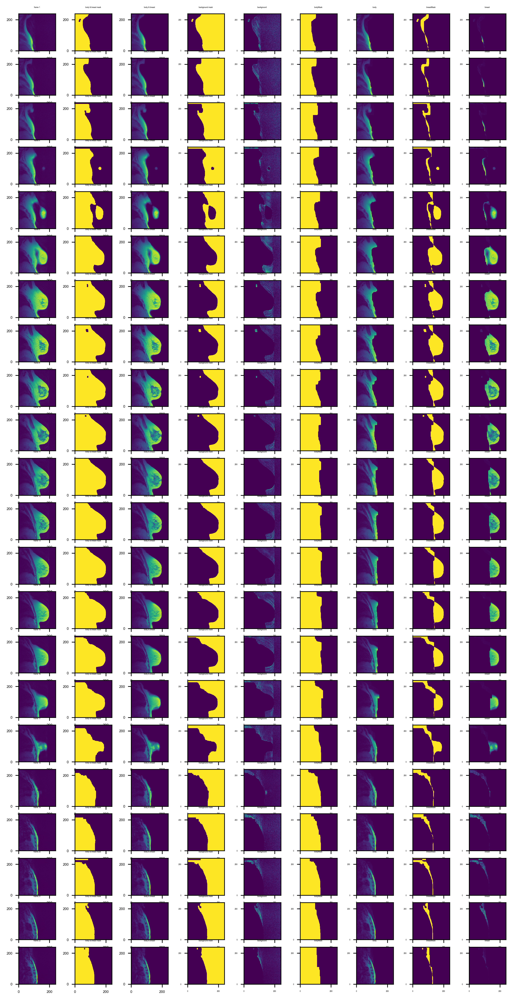

In [18]:

"""
*****************************************************
Parameters for isolating body+breast from background:
*****************************************************
"""


# This time try to close the large holes by looking at the black pixels 
# and turning them to white if the position of the black pixel is left 
# of the centre-of-mass of the the mask averaged for all rows:
#
# Decide whether to perform left-fill operation described above:
#left_fill = 0
left_fill = 1

"""
When thresholding the images to isolate body+breast from background 
it seems reasonable to assign a threshold value as a % of the average
pixel values across all frames.
"""

# The average pixel values averaged across all frames:
avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

# The threshold value for isolating body+breast from background,
# expressed as a % of avePixVal:
thresh_background = 0.4 # = 40% of avePixVal 

#ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 


"""
*****************************************************
Parameters for isolating breast from body+breast:
*****************************************************
"""

""" 
When thresholding the images to isolate breast from body+breast
it seems reasonable to assign a threshold value as a % of the maximum
pixel values on a frame-by-frame basis.
"""
# The threshold value for isolating the breast from body+breast,
# expressed as a % of maxPixVal:
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)

# Select appropriate threshold for body as a % of maxPixVal:
thresh_body = 0.5 # 50% of maxPixVal <-- better than ~20-25% with single maxPixVal
""" 
For some bizarre reason higher values for thresh_body (which result in higher values
of thresh) give a better result, i.e. more body is preserved!!

thresh_body = 0.25 is decent for max_all_frames = 1
"""

max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 

# Chose whether or not to erode bodyAndBreastMasks before using them:
erode_bodyAndBreastMasks = 0
#erode_bodyAndBreastMasks = 1

# Chose whether to use frames or framesBlurred:
use_blurred = 0 # use frames
use_blurred = 1 # use framesBlurred

# Blur kernel for blurring of frames:
blurKernelSize = 15

# For plot titles:
if use_blurred:
    frames_used = 'frames blurred ' 
else:
    frames_used = 'frames ' 



"""
***********************************************************
Kernels used for erosion, dilating and closing operations:
***********************************************************
"""
Kernel3 = np.ones((3,3),np.uint8) # used for eroding and dilating
Kernel5 = np.ones((5,5),np.uint8) # used for dilating
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D arrays for bodyAndBreastMasks, backgroundMasks,
# bodyMasks and breastMasks:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
bodyMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
breastMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'2', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}


pyplot.figure(figsize=(10, 20), dpi=300)

i = 0 # for subplot pos

# Set the subplot column number:
#cols = 12
cols = 9
if left_fill:
    #cols = cols + 2
    cols = cols + 0

if erode_bodyAndBreastMasks:
    cols = cols + 1

    

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if ave_all_frames==0:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background

    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 1
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('BW ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)

    
    # Erode before left-filling:
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
    
    # Dilate:
    mask = cv2.dilate(mask, Kernel5, iterations = 3)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
    # Left-fill holes by turning black pixels white if they are
    # left of the right-most white pixel at that same row (y):
    if left_fill:
        for r in range(dimY):
            # Find the indexes of the white pixels for this row:
            inds = np.where(mask[r,:]==1)[0] # this will return [] if no white pixels!

            if inds.size > 0: # if inds not []
                # Find the centre-of-mass:
                com = int(np.average([inds[0], inds[-1]]))

                for c in range(dimX):
                    if c < com: # the pixel is left of com
                        mask[r,c] = 1

        if 0:
            i = i + 1
            ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
            pyplot.pcolormesh(x, y, mask);
            pyplot.title('left-filled ', **title_font)

            # Set the tick labels font
            for label in (ax.get_xticklabels() + ax.get_yticklabels()):
                label.set_fontname('Arial')
                label.set_fontsize(4)

        # Close holes left behind after left-filling for cases 
        # where ind=[]:
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 

        if 0:
            i = i + 1
            ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
            pyplot.pcolormesh(x, y, mask);
            pyplot.title('close holes ', **title_font)

            # Set the tick labels font
            for label in (ax.get_xticklabels() + ax.get_yticklabels()):
                label.set_fontname('Arial')
                label.set_fontsize(4)
    

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('body & breast mask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)


    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, backgroundMask);
    pyplot.title('background mask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
       
    background = backgroundMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, background);
    pyplot.title('background ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
        
    """ 
     This is very difficult without either leaving out significant breast and/or
     leaving in significant body (ribs).

     I think I need to start by using bodyAndBreastsMasks to remove the background.
     Then select an appropriate threshold and use it to find all pixels < thresh
     that relate to the body and not the breast.
     It might be useful to threshold at a value that is a % of the ave pix value
     in the result of removing the background.

     Isolating the breast was difficult. This time blur the image first 
     (might help reduce holes due to dark blood vessels).
     """

    """ It does seem to perform a bit better - see frame 4 - the breast is preserved """
  

    if use_blurred:
        frame = cv2.GaussianBlur(frames[:,:,f], (blurKernelSize, blurKernelSize), 0)
        frame = cv2.GaussianBlur(frame, (blurKernelSize, blurKernelSize), 0) # blur again
    

    
    if max_all_frames==0:
        maxPixVal = np.max(frame[:,:])
    
    if 0:
        i = i + 1    
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, frame); # note frame could be blurred!
        pyplot.title(frames_used + str(f+1), **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
    
    
        
    if erode_bodyAndBreastMasks:
        # To help with isolating the body from breast, erode 
        # bodyAndBreastMask a little. 
        bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 15)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, bodyAndBreastMask);
        pyplot.title('bodyAndBreastMask eroded', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
    
    """ First isolate the body (and background) from breast using thresh_body: 
    (the background will remain for the time being...)
    """
    
    # Convert to B&W using thresh:
    thresh = maxPixVal*thresh_body
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] < thresh:
                mask[r,c] = 1
    
    # "mask" includes not only body but also background.
    # Use bodyAndBreastMasks to remove the background:
    mask = mask*bodyAndBreastMask
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('BW ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
    # Erode:
    mask = cv2.erode(mask, Kernel3, iterations = 15)
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)

    
    # Dilate:
    mask = cv2.dilate(mask, Kernel3, iterations = 40)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
    # Close holes: 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)

    # Convert mask to binary:
    bodyMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyMask);
    pyplot.title('bodyMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

    # Store masks in 3D arrays:
    bodyMasks[:,:,f] = bodyMask

    # If use_blurred=1, set frame back to un-blurred version before
    # showing results:
    if use_blurred:
        frame = frames[:,:,f] # un-blurred frame
        
    # Show result of bodyMask:
    body = bodyMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, body);
    pyplot.title('body ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

        
        
    # Now with bodyMask and bodyAndBreastMask can get breastMask and breast:
    breastMask = np.bitwise_xor(bodyAndBreastMask, bodyMask)
    breastMasks[:,:,f] = breastMask
    
    breast = breastMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breastMask);
    pyplot.title('breastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breast);
    pyplot.title('breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        

Working on frame 1 of 22 ...
Working on frame 2 of 22 ...
Working on frame 3 of 22 ...
Working on frame 4 of 22 ...
Working on frame 5 of 22 ...
Working on frame 6 of 22 ...
Working on frame 7 of 22 ...
Working on frame 8 of 22 ...
Working on frame 9 of 22 ...
Working on frame 10 of 22 ...
Working on frame 11 of 22 ...
Working on frame 12 of 22 ...
Working on frame 13 of 22 ...
Working on frame 14 of 22 ...
Working on frame 15 of 22 ...
Working on frame 16 of 22 ...
Working on frame 17 of 22 ...
Working on frame 18 of 22 ...
Working on frame 19 of 22 ...
Working on frame 20 of 22 ...
Working on frame 21 of 22 ...
Working on frame 22 of 22 ...


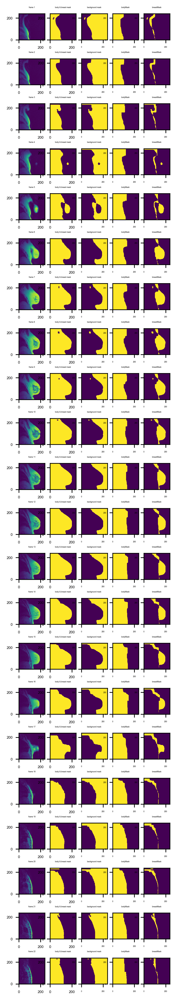

In [21]:
# Same as above but plotting of masks only


"""
*****************************************************
Parameters for isolating body+breast from background:
*****************************************************
"""


# This time try to close the large holes by looking at the black pixels 
# and turning them to white if the position of the black pixel is left 
# of the centre-of-mass of the the mask averaged for all rows:
#
# Decide whether to perform left-fill operation described above:
#left_fill = 0
left_fill = 1

"""
When thresholding the images to isolate body+breast from background 
it seems reasonable to assign a threshold value as a % of the average
pixel values across all frames.
"""

# The average pixel values averaged across all frames:
avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

# The threshold value for isolating body+breast from background,
# expressed as a % of avePixVal:
thresh_background = 0.4 # = 40% of avePixVal 

#ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 


"""
*****************************************************
Parameters for isolating breast from body+breast:
*****************************************************
"""

""" 
When thresholding the images to isolate breast from body+breast
it seems reasonable to assign a threshold value as a % of the maximum
pixel values on a frame-by-frame basis.
"""
# The threshold value for isolating the breast from body+breast,
# expressed as a % of maxPixVal:
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)

# Select appropriate threshold for body as a % of maxPixVal:
thresh_body = 0.5 # 50% of maxPixVal <-- better than ~20-25% with single maxPixVal
""" 
For some bizarre reason higher values for thresh_body (which result in higher values
of thresh) give a better result, i.e. more body is preserved!!

thresh_body = 0.25 is decent for max_all_frames = 1
"""

max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 

# Chose whether or not to erode bodyAndBreastMasks before using them:
erode_bodyAndBreastMasks = 0
#erode_bodyAndBreastMasks = 1

# Chose whether to use frames or framesBlurred:
use_blurred = 0 # use frames
use_blurred = 1 # use framesBlurred

# Blur kernel for blurring of frames:
blurKernelSize = 15

# For plot titles:
if use_blurred:
    frames_used = 'frames blurred ' 
else:
    frames_used = 'frames ' 



"""
***********************************************************
Kernels used for erosion, dilating and closing operations:
***********************************************************
"""
Kernel3 = np.ones((3,3),np.uint8) # used for eroding and dilating
Kernel5 = np.ones((5,5),np.uint8) # used for dilating
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D arrays for bodyAndBreastMasks, backgroundMasks,
# bodyMasks and breastMasks:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
bodyMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')
breastMasks = np.zeros((dimY, dimX, dimZ), dtype='uint8')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'2', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}


pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

# Set the subplot column number:
#cols = 12
cols = 5
if left_fill:
    #cols = cols + 2
    cols = cols + 0

if erode_bodyAndBreastMasks:
    cols = cols + 1

    

for f in range(dimZ):
    print('Working on frame', str(f+1), 'of', str(dimZ), '...')
    
    frame = frames[:,:,f]
    
    if ave_all_frames==0:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background

    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 1
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('BW ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)

    
    # Erode before left-filling:
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
    
    # Dilate:
    mask = cv2.dilate(mask, Kernel5, iterations = 3)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
    # Left-fill holes by turning black pixels white if they are
    # left of the right-most white pixel at that same row (y):
    if left_fill:
        for r in range(dimY):
            # Find the indexes of the white pixels for this row:
            inds = np.where(mask[r,:]==1)[0] # this will return [] if no white pixels!

            if inds.size > 0: # if inds not []
                # Find the centre-of-mass:
                com = int(np.average([inds[0], inds[-1]]))

                for c in range(dimX):
                    if c < com: # the pixel is left of com
                        mask[r,c] = 1

        if 0:
            i = i + 1
            ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
            pyplot.pcolormesh(x, y, mask);
            pyplot.title('left-filled ', **title_font)

            # Set the tick labels font
            for label in (ax.get_xticklabels() + ax.get_yticklabels()):
                label.set_fontname('Arial')
                label.set_fontsize(4)

        # Close holes left behind after left-filling for cases 
        # where ind=[]:
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 

        if 0:
            i = i + 1
            ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
            pyplot.pcolormesh(x, y, mask);
            pyplot.title('close holes ', **title_font)

            # Set the tick labels font
            for label in (ax.get_xticklabels() + ax.get_yticklabels()):
                label.set_fontname('Arial')
                label.set_fontsize(4)
    

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('body & breast mask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, bodyAndBreast);
        pyplot.title('body & breast ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, backgroundMask);
    pyplot.title('background mask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
       
    background = backgroundMask*frame
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, background);
        pyplot.title('background ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
        
    """ 
     This is very difficult without either leaving out significant breast and/or
     leaving in significant body (ribs).

     I think I need to start by using bodyAndBreastsMasks to remove the background.
     Then select an appropriate threshold and use it to find all pixels < thresh
     that relate to the body and not the breast.
     It might be useful to threshold at a value that is a % of the ave pix value
     in the result of removing the background.

     Isolating the breast was difficult. This time blur the image first 
     (might help reduce holes due to dark blood vessels).
     """

    """ It does seem to perform a bit better - see frame 4 - the breast is preserved """
  

    if use_blurred:
        frame = cv2.GaussianBlur(frames[:,:,f], (blurKernelSize, blurKernelSize), 0)
        frame = cv2.GaussianBlur(frame, (blurKernelSize, blurKernelSize), 0) # blur again
    

    
    if max_all_frames==0:
        maxPixVal = np.max(frame[:,:])
    
    if 0:
        i = i + 1    
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, frame); # note frame could be blurred!
        pyplot.title(frames_used + str(f+1), **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
    
    
        
    if erode_bodyAndBreastMasks:
        # To help with isolating the body from breast, erode 
        # bodyAndBreastMask a little. 
        bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 15)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, bodyAndBreastMask);
        pyplot.title('bodyAndBreastMask eroded', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
    
    """ First isolate the body (and background) from breast using thresh_body: 
    (the background will remain for the time being...)
    """
    
    # Convert to B&W using thresh:
    thresh = maxPixVal*thresh_body
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] < thresh:
                mask[r,c] = 1
    
    # "mask" includes not only body but also background.
    # Use bodyAndBreastMasks to remove the background:
    mask = mask*bodyAndBreastMask
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('BW ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
    # Erode:
    mask = cv2.erode(mask, Kernel3, iterations = 15)
    
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)

    
    # Dilate:
    mask = cv2.dilate(mask, Kernel3, iterations = 40)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        
    # Close holes: 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50)

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)

    # Convert mask to binary:
    bodyMask = cv2.threshold(mask, 0.5, 1, cv2.THRESH_BINARY)[1]
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyMask);
    pyplot.title('bodyMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)

    # Store masks in 3D arrays:
    bodyMasks[:,:,f] = bodyMask

    # If use_blurred=1, set frame back to un-blurred version before
    # showing results:
    if use_blurred:
        frame = frames[:,:,f] # un-blurred frame
        
    # Show result of bodyMask:
    body = bodyMask*frame

    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, body);
        pyplot.title('body ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)

        
        
    # Now with bodyMask and bodyAndBreastMask can get breastMask and breast:
    breastMask = np.bitwise_xor(bodyAndBreastMask, bodyMask)
    breastMasks[:,:,f] = breastMask
    
    breast = breastMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breastMask);
    pyplot.title('breastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(2)
        
    if 0:
        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, breast);
        pyplot.title('breast ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(2)
        